--2025-10-27 13:53:41--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.16.57, 3.5.3.52, 16.15.181.216, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.16.57|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘./coco/annotations/annotations_trainval2017.zip’

./coco/annotations/ 100%[===================>] 241.19M  96.3MB/s    in 2.5s    

2025-10-27 13:53:43 (96.3 MB/s) - ‘./coco/annotations/annotations_trainval2017.zip’ saved [252907541/252907541]

Using annotation file: ./coco/annotations/annotations/instances_train2017.json
loading annotations into memory...
Done (t=14.84s)
creating index...
index created!
Total images in this dataset: 118287
Selected 20000 random images.


Image download completed (or skipped if already present).


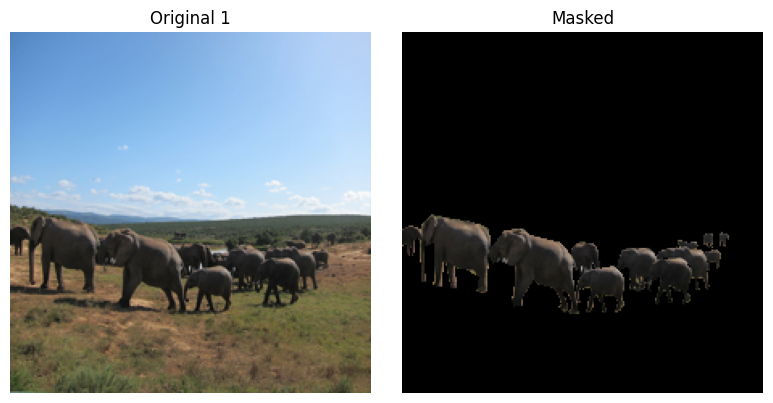

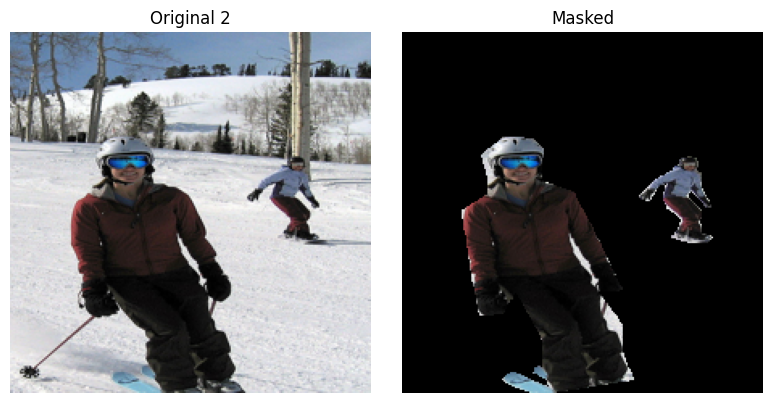

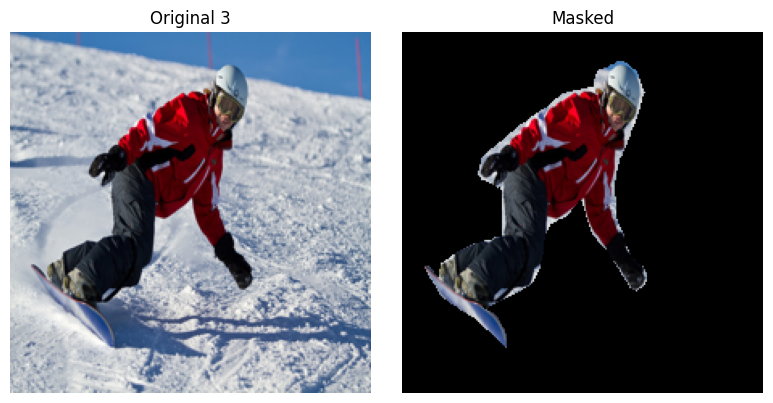

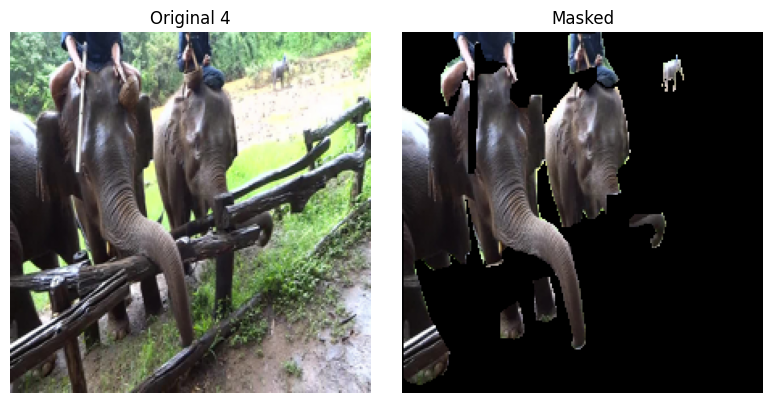

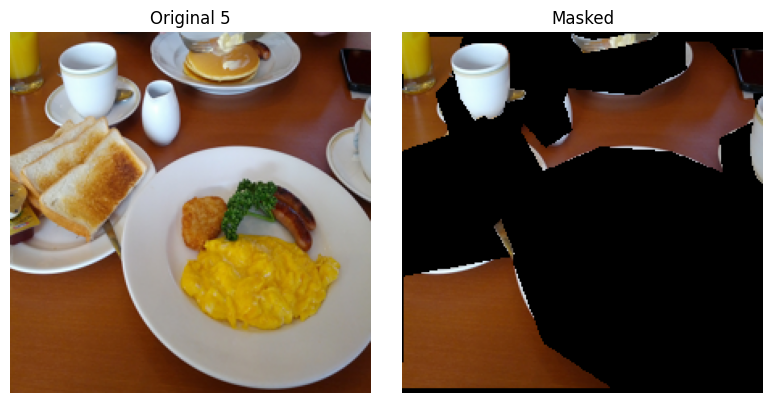

...

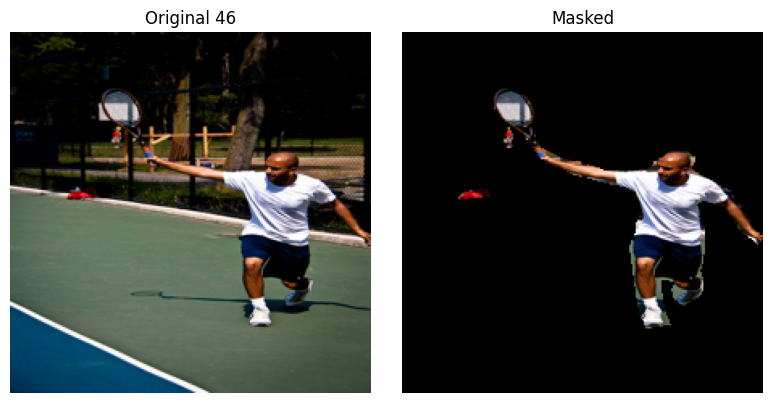

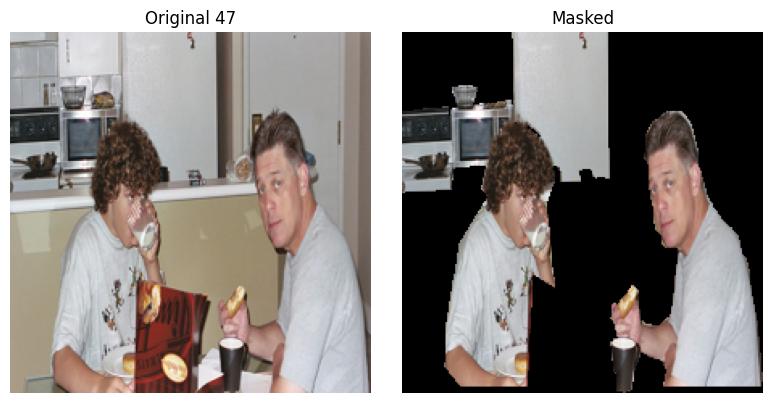

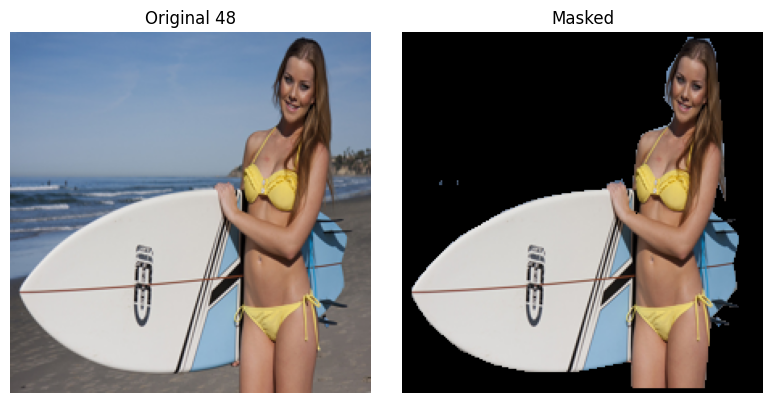

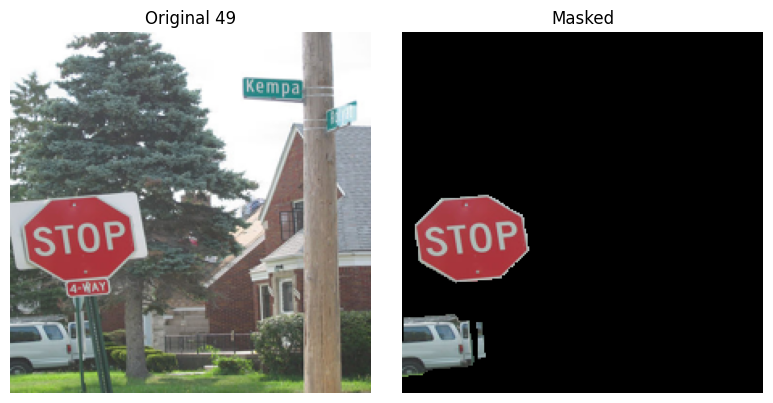

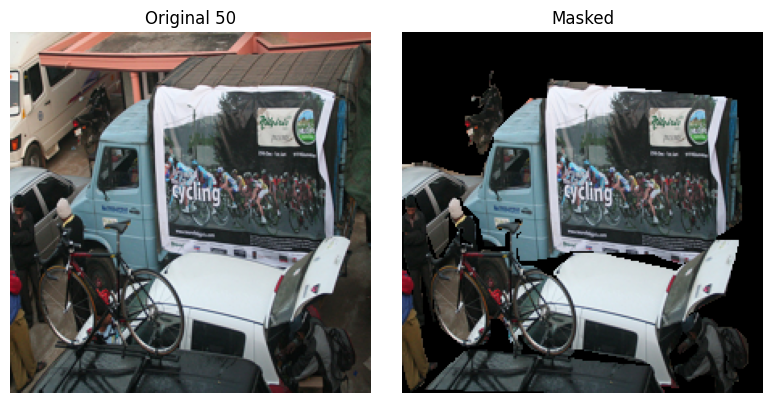

In [3]:

!pip install pycocotools tqdm requests pillow matplotlib

import os
import random
import requests
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from pycocotools.coco import COCO

# Make folders
os.makedirs('./coco/images', exist_ok=True)
os.makedirs('./coco/annotations', exist_ok=True)


ann_zip = './coco/annotations/annotations_trainval2017.zip'
if not os.path.exists(ann_zip):
    !wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O $ann_zip
    !unzip -q $ann_zip -d ./coco/annotations/


ann_train = './coco/annotations/annotations/instances_train2017.json'
ann_val = './coco/annotations/annotations/instances_val2017.json'

# Pick whichever exists
if os.path.exists(ann_train):
    annFile = ann_train
else:
    annFile = ann_val

print(f"Using annotation file: {annFile}")

coco = COCO(annFile)
img_ids = coco.getImgIds()

print("Total images in this dataset:", len(img_ids))

# Safe sample (max 20,000)
k = min(20000, len(img_ids))
random_ids = random.sample(img_ids, k)
print(f"Selected {k} random images.")


os.makedirs('./coco/images', exist_ok=True)

for img_id in tqdm(random_ids, desc="Downloading images"):
    try:
        img_data = coco.loadImgs(img_id)[0]
        img_url = img_data['coco_url']
        filename = os.path.join('./coco/images', os.path.basename(img_url))


        if not os.path.exists(filename):
            response = requests.get(img_url, timeout=10)
            if response.status_code == 200:
                with open(filename, 'wb') as f:
                    f.write(response.content)
    except Exception as e:
        print(f"Error downloading image {img_id}: {e}")
        continue

print("Image download completed (or skipped if already present).")


display_ids = random.sample(random_ids, min(50, len(random_ids)))

for i, img_id in enumerate(display_ids):
    try:
        img_data = coco.loadImgs(img_id)[0]
        filename = os.path.join('./coco/images', os.path.basename(img_data['coco_url']))

        # Load image
        img = Image.open(filename).convert('RGB')

        # Load mask
        ann_ids = coco.getAnnIds(imgIds=img_data['id'])
        anns = coco.loadAnns(ann_ids)
        mask = np.zeros((img_data['height'], img_data['width']), dtype=np.uint8)
        for ann in anns:
            mask += coco.annToMask(ann)
        mask = (mask > 0).astype(np.uint8)


        img_resized = np.array(img.resize((224, 224)))
        mask_resized = np.array(Image.fromarray(mask).resize((224, 224)))
        mask_3d = np.repeat(mask_resized[:, :, np.newaxis], 3, axis=2)
        masked_img = img_resized * mask_3d

        # Plot
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img_resized)
        plt.title(f"Original {i+1}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(masked_img)
        plt.title("Masked")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error visualizing image {img_id}: {e}")
        continue
